In [44]:
import numpy as np
from scipy.linalg import  eigh

In [2]:
def makeLaplacion(N):
    '''
    创建laplacian matrix,对角是2,off 对角是-1，左上和右下都是-1，
    '''
    M=np.eye(N,N)*2
    i,j=np.diag_indices_from(M)
    M[i[:-1],(j+1)[:-1]]=-1
    M[i[1:],j[1:]-1]=-1
    
    M[0][-1]=-1
    M[-1][0]=-1
    return M
def makeFourBasic(N):
    r=np.arange(N)
    power=np.outer(r,r)
    F=np.exp((2*np.pi*1j/N)*power)
    return F
def validate(R):
    '''
    分别打印实和虚， 把1e-6的变成0
    '''
    I=R.imag
    R=R.real
    
    mask=np.abs(R)<1e-6
    R[mask]=0
    

    mask=np.abs(I)<1e-6
    I[mask]=0
    
    
    print(R)
    assert np.all(I)==0

In [3]:
N=5
M=makeLaplacion(N)
S,V=eigh(M)

### 傅立叶 basic是那个laplician matrix的 eigfunction?

$$w_j={}_\{ exp(\frac{2\pi i j k}{N})\}_{k}$$

In [4]:
N=8
F=makeFourBasic(N)
FH=F.conj().T
Finv=FH/N

R=F.dot(Finv)
validate(R)
# D=np.diag(np.arange(N))

# R=F.dot(FH)
# validate(R)
# M=F.dot(D).dot(FH)
# validate(M)

[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]]


In [5]:
# 我的目的是构造一个 对称矩阵 L=W A Wh,
# 开始猜想是使用 A=diag([0,....N-1])
D=np.diag(np.arange(N))
R=F.dot(D).dot(FH)
validate(R)

[[28. -4. -4. -4. -4. -4. -4. -4.]
 [-4. 28. -4. -4. -4. -4. -4. -4.]
 [-4. -4. 28. -4. -4. -4. -4. -4.]
 [-4. -4. -4. 28. -4. -4. -4. -4.]
 [-4. -4. -4. -4. 28. -4. -4. -4.]
 [-4. -4. -4. -4. -4. 28. -4. -4.]
 [-4. -4. -4. -4. -4. -4. 28. -4.]
 [-4. -4. -4. -4. -4. -4. -4. 28.]]


# 可以看出规律来
#  $$D_{ii}=\frac{n(n-1)}{2}$$
#  $$D_{ij}=\frac{n}{2}$$

# 如果加上 off diag=-1的限制，A 应该取如下

$$A=\{0,1,2,3,.....N-1\}* \frac{2}{N}$$

In [6]:
N=10
F=makeFourBasic(N)
FH=F.conj().T

D=np.diag(np.arange(N))*2/N
R=F.dot(D).dot(FH)
validate(R)

[[ 9. -1. -1. -1. -1. -1. -1. -1. -1. -1.]
 [-1.  9. -1. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1.  9. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1.  9. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1.  9. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1.  9. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1.  9. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1.  9. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.  9. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1. -1.  9.]]


In [91]:
#随机图
import sys

import matplotlib.pyplot as plt
import networkx as nx
%matplotlib inline 

def gridGrap(size=5):
    G = nx.grid_2d_graph(size, size)  # 5x5 grid
    return G
def starGraph(size=20):
    G = nx.star_graph(size)
    return G

[[24  0  0 ...  0  0  0]
 [ 0 23  0 ...  0  0  0]
 [ 0  0 13 ...  0  0  0]
 ...
 [ 0  0  0 ... 21  0  0]
 [ 0  0  0 ...  0 20  0]
 [ 0  0  0 ...  0  0 24]]


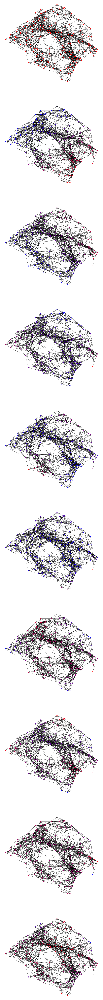

In [113]:
def normal(c,eps=1e-6):
    cmin=np.min(c)
    cmax=np.max(c)
    return (c-cmin+eps)/(cmax-cmin+eps)
def drawSubGraph(G):
    pos=nx.spring_layout(G)
    L=np.array(nx.laplacian_matrix(G).todense())
    A=np.array(nx.adj_matrix(G).todense())
    D=L+A
    print(D)
#     L=(D**-0.5).dot(L).dot(D**-0.5)
    S,V=eigh(L)
    Vsize=len(S)
    K=10
    plt.figure(figsize=(20,20*K))
    for i in range(K):
        plt.subplot(K,1,i+1)
        red_color=normal(V[:,i])
        color=[]
        for r in red_color:
            color.append((r,0,1-r))
        nx.draw(G,node_size=100,pos=pos,node_color=color)
G = nx.random_geometric_graph(200, 0.2)
drawSubGraph(G)


In [114]:
G=starGraph(3)
np.array(nx.adj_matrix(G).todense())

array([[0, 1, 1, 1],
       [1, 0, 0, 0],
       [1, 0, 0, 0],
       [1, 0, 0, 0]], dtype=int64)